<a href="https://colab.research.google.com/github/kei-ai/Colab/blob/main/pycuda.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install pycuda
import pycuda.driver as cuda
import pycuda.autoinit
from pycuda.compiler import SourceModule
import numpy as np
from PIL import Image 
import cv2
import time

     |████████████████████████████████| 1.7 MB 9.4 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 63 kB 2.6 MB/s 
     |████████████████████████████████| 75 kB 5.3 MB/s 
  Created wheel for pycuda: filename=pycuda-2021.1-cp37-cp37m-linux_x86_64.whl size=627662 sha256=df5cb89bf7f0bec13d8e1c8fef52a9194fae39843e802db4b568bba586155e32
  Stored in directory: /root/.cache/pip/wheels/c4/ef/49/dc6a5feb8d980b37c83d465ecab24949a6aa19458522a9e001
  Created wheel for pytools: filename=pytools-2021.2.7-py2.py3-none-any.whl size=60644 sha256=040b229f3ae3756ba185e20c5f52715fda957da0e4a3bb58a61d18d8636f3c6a
  Stored in directory: /root/.cache/pip/wheels/3b/e6/1e/e2c110b06fec75aa257f96bc1cd525c212375ef8d7fb3435a4
Successfully built pycuda pytools


/content/drive/MyDrive/2.RUTILEA/実験3
height =  580
width  =  772


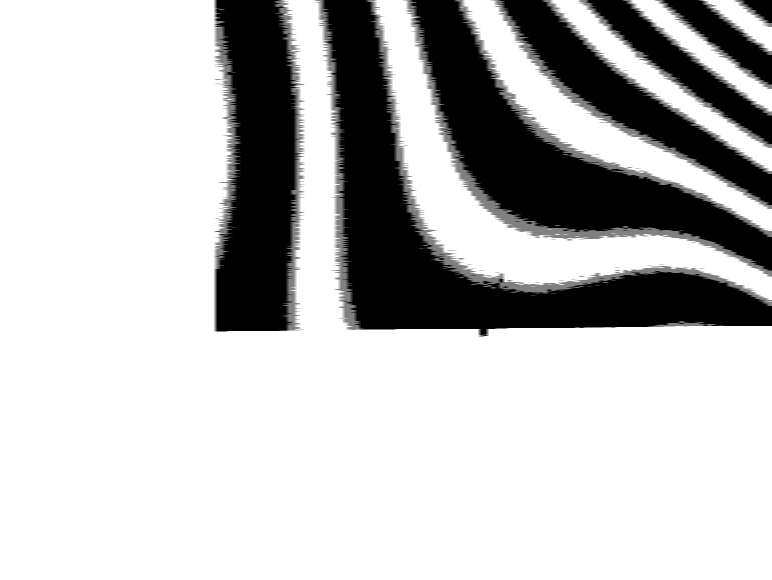

In [ ]:
%cd /content/drive/MyDrive/2.RUTILEA/実験3
img_file='5-5'
img_file_name=img_file+".png"

SR=16
SR2=SR/4



from PIL import Image 
#
# 以下CUDAカーネル
#

mod = SourceModule("""

#define M_PI 3.141592654f

__global__ void get_diff(unsigned char *image, float *delta){

    int idx = threadIdx.x + blockDim.x* blockIdx.x;
    if(threadIdx.x < blockDim.x-4)
    {
        delta[idx] = (int(image[idx+4]) - int(image[idx]))/4.0;
    }
    else
    {
        delta[idx] = delta[idx-4];
    }
}

__global__ void get_moire_images(unsigned char *phase,
                      unsigned char *image,
                      float *delta,
                      int width, int height){

    int idx = threadIdx.x + blockDim.x * blockIdx.x;
    int idy = width*blockIdx.x;

    int x;
    float s;
    int p;
    int page=0;

    for(int n=0;n<4;n++){
        if(threadIdx.x >= n){
            x = (threadIdx.x-n) % 4;
            s = delta[idx-x];
            p = image[idx-x] + x*s;
        }else{
            p = image[idy+n] - (n-threadIdx.x)*delta[idy+n];
        }
        if(p<0){
            p=0;
        }else if(p>255){
            p=255;
        }
        phase[page+idx] = p;
        page += width*height;
    }
}

__global__ void phaze_shift(unsigned char *phase,
                      unsigned char *output,
                      int width, int height){

    int idx = threadIdx.x + blockDim.x * blockIdx.x;

    float denominator = 0;
    float numerator = 0;
    int page = 0;

    for(int n=0;n<4;n++){
        denominator += phase[page+idx] * cos(2.0 * M_PI * n / 4.0);
        numerator += phase[page+idx] * sin(2.0 * M_PI * n / 4.0);
        page += width*height;
    }

    output[idx] = (int)((atan(numerator/denominator)/M_PI+0.5)*255);

}
""")

def GetMoireInputImage(ColorImage):
    """
    引数のColorImageをグレースケールに変換し、格子ピッチがN画素となるようにダウンサンプリングする。
    numpy.ndarray ColorImage : 処理したいカラー画像
    return : 格子ピッチに応じてダウンサンプリングされたグレースケール画像
    """

    grayImage = cv2.cvtColor(ColorImage, cv2.COLOR_BGR2GRAY)

    SamplingRate = SR2
    #格子ピッチに応じてSamplingRateを決定 
    #格子の1ピッチがN画素となるようにダウンサンプリング
    #SamplingImage = cv2.resize(grayImage, size, interpolation = cv2.INTER_LINEAR)
    SamplingImage = cv2.resize(grayImage, None, fx = 1 / SamplingRate, fy = 1 / SamplingRate,  interpolation = cv2.INTER_LINEAR)

    return SamplingImage

#
# 画像の読みこみ
#

img = cv2.imread(img_file_name)
image = GetMoireInputImage(img)

pil_output_image = Image.fromarray(image)
pil_output_image.save("input.png")

height, width = image.shape[:2]

print("height = ", height)
print("width  = ", width)

#
# CUDA周りの準備
#

# GPUメモリの確保
d_image = cuda.mem_alloc(image.nbytes)
d_delta = cuda.mem_alloc(image.nbytes*4)
d_phase = cuda.mem_alloc(image.nbytes*4)

# output画像の他に位相をずらした画像も確認したいので、ホストメモリを確保
phase = np.zeros((4,height,width), dtype=np.uint8)
output = np.zeros((height,width), dtype=np.uint8)

# 上で定義したCUDAのカーネル関数をPython側で呼び出す準備
get_diff = mod.get_function("get_diff")
get_moire_images = mod.get_function("get_moire_images")
phaze_shift = mod.get_function("phaze_shift")

# GPUのグリッド・ブロックサイズの設定
block   = (width,1,1)
grid    = (height,1,1)

# input画像をGPUメモリへ転送
cuda.memcpy_htod(d_image,image)

# deltaを求める
get_diff(d_image,
     d_delta,
     block=block, grid=grid)

# 間引き画像を求める
get_moire_images(d_phase,
      d_image,
      d_delta,
      np.int32(width),
      np.int32(height),
      block=block, grid=grid)

# 位相をずらした画像をGPUからホストメモリに転送
cuda.memcpy_dtoh(phase,d_phase)

# 位相シフト法
phaze_shift(d_phase,
      cuda.Out(output),
      np.int32(width),
      np.int32(height),
      block=block, grid=grid)
#
# 処理後の画像を保存
#
image_in = Image.fromarray(image)
image_in.save(img_file+"_input.png")
image_0 = Image.fromarray(phase[0,:,:].reshape(height,width))
image_0.save(img_file+"_phase00.png")
image_1 = Image.fromarray(phase[1,:,:].reshape(height,width))
image_1.save(img_file+"_phase01.png")
image_2 = Image.fromarray(phase[2,:,:].reshape(height,width))
image_2.save(img_file+"_phase02.png")
image_3 = Image.fromarray(phase[3,:,:].reshape(height,width))
image_3.save(img_file+"_phase03.png")
image_out = Image.fromarray(np.uint8(output))
image_out.save(img_file+"_output_"+str(SR)+".png")
image_1

/content/drive/MyDrive/2.RUTILEA/実験3


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: divide by zero encountered in true_divide
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: RuntimeWarning: invalid value encountered in true_divide


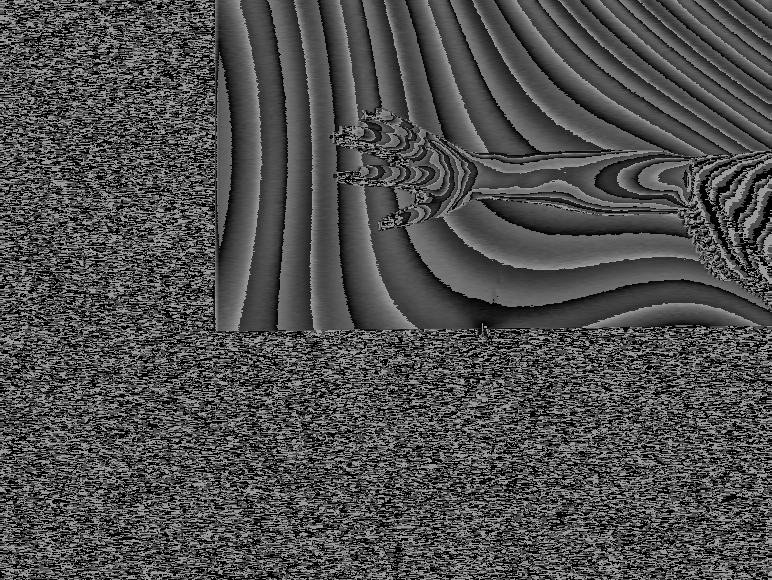

In [ ]:
#位相生成
%cd /content/drive/MyDrive/2.RUTILEA/実験3
import cv2
import numpy as np
from PIL import Image 
import cv2

import time
img_gray=[[0]*10]*10
array=[[0]*10]*10
Phi=[[0]*100]*100
i=1
img_file="5-2"
for j in range(0,4):
  img = cv2.imread(str(img_file)+'_phase0'+str(j)+'.png')
  array[i][j]=cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  img_gray[i][j] = Image.fromarray(array[i][j])

try:
  Phi[0]=np.arctan(-(array[i][3]-array[i][1])/(array[i][2]-array[i][0]))
except ZeroDivisionError:
  print('error')

from PIL import Image 
Phi_img=Image.fromarray(np.uint8(Phi[0]*100))
Phi_img.save('Phi_'+str(img_file)+'.png')
Phi_img

In [ ]:
Phi[0][-20:-1,0]

array([-2.45249462, -2.45249462, -2.45249462, -3.22799212, -2.45657623,
       -2.833001  , -3.1472329 , -2.50706225, -2.50706225, -1.72166409,
       -2.44665197, -2.48353718, -2.48344459, -2.45647254, -2.50706225,
       -2.48698463, -2.48267684, -2.47331979, -1.71567613])

In [ ]:
a[-20:-1,0]

array([-2.45249462, -2.45249462, -2.45249462, -3.22799212, -2.45657623,
       -2.833001  , -3.1472329 , -2.50706225, -2.50706225, -1.72166409,
       -2.44665197, -2.48353718, -2.48344459, -2.45647254, -2.50706225,
       -2.48698463, -2.48267684, -2.47331979, -1.71567613])

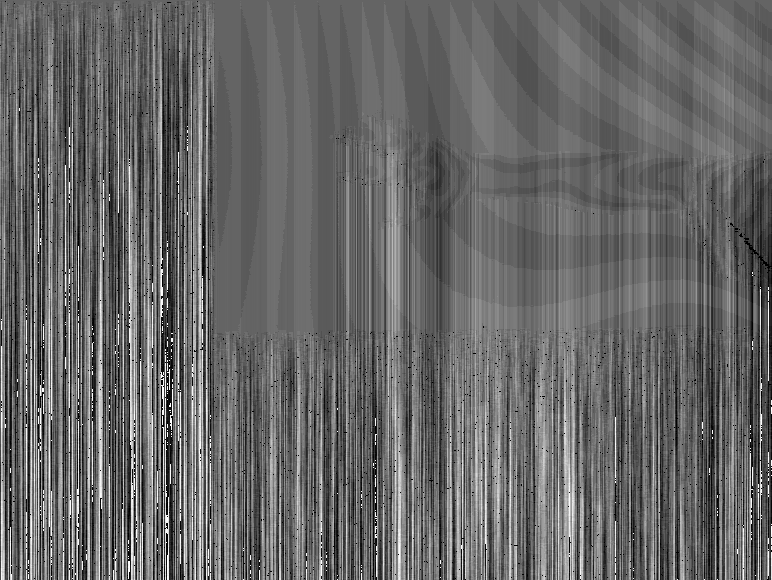

In [ ]:
Image.fromarray(np.uint8((a-Phi[0])*10+100))

/content/drive/MyDrive/2.RUTILEA/実験3
[[116 109 101  93  88  83  79  75  70  64  60  55  52  48  45  39  32  25
   17  10   4 251 243 236 228 222 216 212 207]
 [135 125 115 105  96  88  83  78  75  70  66  61  58  55  50  45  40  36
   32  25  17   6 249 240 232 226 220 217 214]
 [144 134 124 113 105  98  90  84  79  73  69  66  62  59  57  54  52  48
   42  32  21  10 253 245 238 231 224 221 217]
 [147 139 129 119 112 106  99  93  86  79  73  67  62  58  56  52  50  43
   37  31  24  19  13   6 253 244 235 231 227]
 [158 151 140 129 121 113 107 102  95  87  80  73  70  67  65  61  57  51
   46  41  37  31  25  15   5 249 239 233 228]
 [160 156 150 143 135 129 121 113 106  98  93  88  83  78  73  67  63  57
   53  48  43  37  29  22  14   7   1 252 248]
 [175 169 162 154 146 138 129 120 115 109 102  96  88  80  74  68  66  61
   58  53  47  42  38  35  32  26  20  16  13]
 [176 171 166 160 155 148 140 131 123 115 107 100  92  84  80  74  72  69
   66  62  58  54  50  45  41  33  27  22 

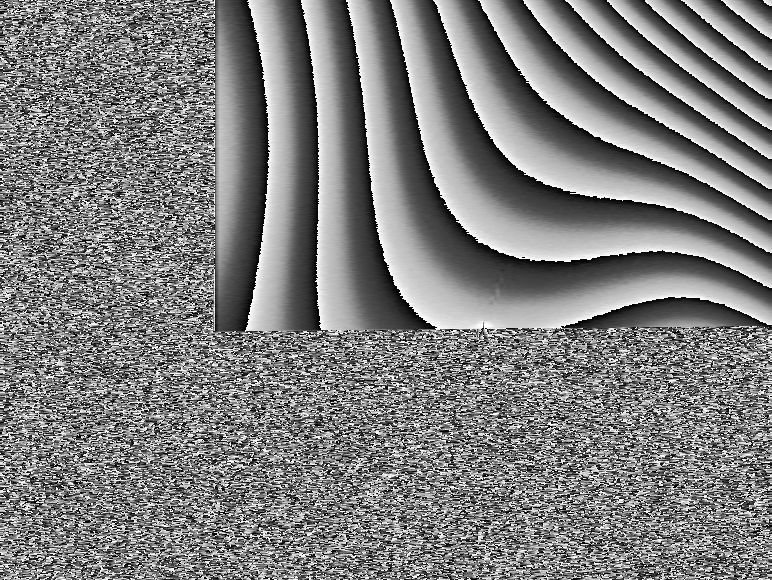

In [18]:
#output を import
%cd /content/drive/MyDrive/2.RUTILEA/実験3
import cv2
import numpy as np
from PIL import Image 
import cv2
import time

ary=cv2.cvtColor(cv2.imread('5_output_16.png'), cv2.COLOR_BGR2GRAY)
img= Image.fromarray(ary)
print(ary[0:10,-30:-1])
img

In [17]:
print(a[0:10,-30:-1])

[[ 73  68  66  62  57  52  46  39  32  23  14   8   3 252 247 239 232 222
  214 209 204 201 197 195 191 190 183 177 170]
 [ 73  68  66  62  59  56  52  47  42  36  29  23  16   5 249 241 233 226
  219 214 209 205 200 196 193 190 187 183 179]
 [ 84  78  76  70  66  61  57  54  49  44  39  33  26  19  11   4 251 240
  229 221 214 210 206 202 198 196 192 188 184]
 [ 88  83  81  75  71  67  63  60  58  55  51  45  38  29  20  12   3 247
  237 229 222 216 210 207 204 202 197 192 187]
 [ 97  88  84  76  72  68  65  62  60  57  55  51  46  39  31  25  19  11
    3 248 238 229 220 214 209 206 202 199 196]
 [112 105  96  86  81  75  73  70  68  65  63  59  55  48  42  36  30  21
   12   4 251 240 229 220 213 209 204 200 197]
 [116 109 102  93  89  84  80  73  68  65  63  59  55  52  48  42  36  27
   18  11   3 249 239 232 225 220 213 210 206]
 [129 121 114 105  98  92  84  76  72  70  68  63  58  55  53  48  42  35
   26  20  13   4 249 240 231 222 213 210 206]
 [141 132 123 111 104  97  92  8

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: overflow encountered in ubyte_scalars
  # This is added back by InteractiveShellApp.init_path()


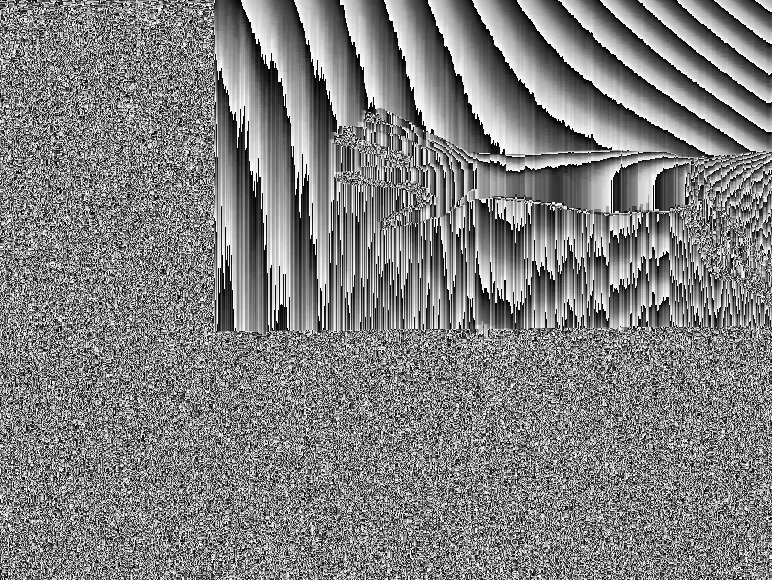

In [16]:
#位相アンラッピング(from output)
a=ary
import math
d=200
n=a.shape[0]
for y in range(0,a.shape[1]):
  for x in range(1,n):
    if np.isnan(a[x,y])==True:
      a[x,y]= a[x-1,y]
    else:
      delta=a[x,y]-a[x-1,y]
      if delta<-d or delta>d:
        a[x:n,y]-=delta

Image.fromarray(np.uint8(a))

In [25]:
image_unwrapped

array([[100.53096491, 101.53096491, 102.53096491, ..., -96.81415022,
        -96.81415022, -96.81415022],
       [102.24777961, 102.24777961, 100.24777961, ..., -96.81415022,
        -96.81415022, -96.81415022],
       [102.53096491, 102.53096491, 101.53096491, ..., -96.81415022,
        -96.81415022, -96.81415022],
       ...,
       [154.79644737, 154.79644737, 148.51326207, ...,  70.11503838,
         71.11503838,  71.11503838],
       [149.51326207, 150.51326207, 151.51326207, ...,  73.11503838,
         73.11503838,  73.11503838],
       [152.51326207, 152.51326207, 153.79644737, ...,  74.83185307,
         72.11503838,  75.11503838]])

In [27]:
image

array([[ 0,  1,  2, ..., 10, 10, 10],
       [ 8,  8,  6, ..., 10, 10, 10],
       [ 2,  2,  1, ..., 10, 10, 10],
       ...,
       [ 4,  4,  4, ...,  1,  2,  2],
       [ 5,  6,  7, ...,  4,  4,  4],
       [ 8,  8,  3, ..., 12,  3,  6]], dtype=uint8)

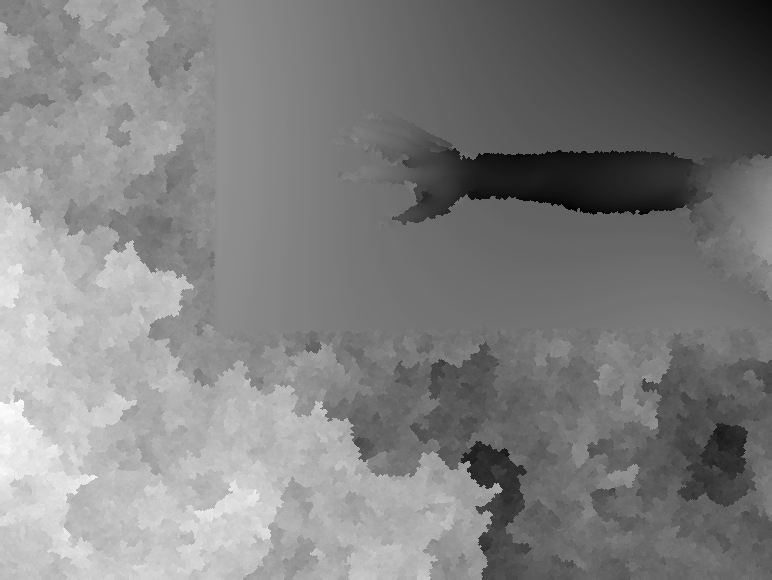

In [31]:
#位相アンラッピング(skimage)
import numpy as np
from matplotlib import pyplot as plt
from skimage import data, img_as_float, color, exposure
from skimage.restoration import unwrap_phase


# Load an image as a floating-point grayscale
image = cv2.cvtColor(cv2.imread('5-2_output_16.png'), cv2.COLOR_BGR2GRAY)
# Scale the image to [0, 4*pi]
image = exposure.rescale_intensity(image, out_range=(0, 4 * np.pi))
# Create a phase-wrapped image in the interval [-pi, pi)
image_wrapped = np.angle(np.exp(1j * image))
# Perform phase unwrapping
image_unwrapped = unwrap_phase(image_wrapped)

image_unwrapped = exposure.rescale_intensity(image_unwrapped, out_range=(0, 255))

Image.fromarray(np.uint8(image_unwrapped))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: RuntimeWarning: overflow encountered in ubyte_scalars
  # This is added back by InteractiveShellApp.init_path()


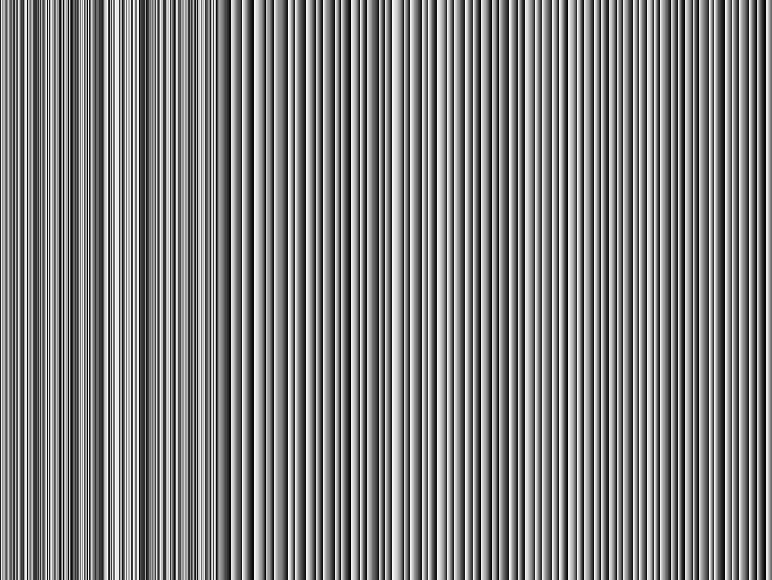

In [4]:
#位相アンラッピング2
a=ary
import math
d=math.pi/4
n=a.shape[0]
for y in range(0,a.shape[1]):
  for x in range(1,n):
    if np.isnan(a[x,y])==True:
      a[x,y]= a[x-1,y]
    else:
      delta=a[x,y]-a[x-1,y]
      if delta<-d or delta>d:
        a[x:n,y]-=delta

Image.fromarray(np.uint8((a+10)*5))

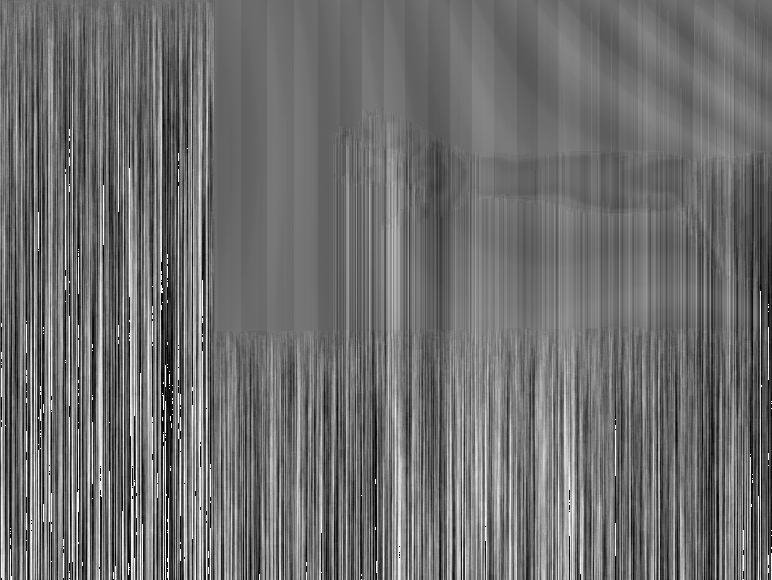

In [ ]:
Image.fromarray(np.uint8((a+10)*10))

In [ ]:
idx = np.unravel_index(np.argmin(a), a.shape)
print(idx)
a[1,5]

(1, 5)


nan

In [ ]:
int(Phi[0].shape[1]/16)

48

In [ ]:
connect2=Phi[0]

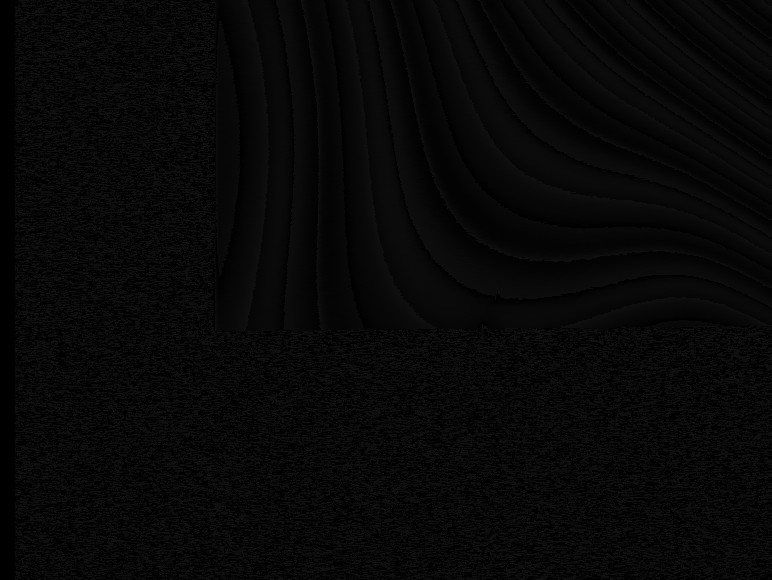

In [ ]:
N=16
#for a in range(0,2):
a=0
connect2[:,a*N+0:a*N+15]=2*math.pi*a
Phi_img2=Image.fromarray(np.uint8(connect2*10))
Phi_img2

In [ ]:
Phi[1]=Phi[0][0:10,-20:-1]
Phi[1]

array([[0.82932593, 0.88829435, 0.92030775, 0.96727391, 1.01043645,
        1.08366967, 1.17007366, 1.26233893, 1.35872292, 1.44009038,
        1.51967811, 0.72055414, 0.75800775, 0.79501325, 0.8411778 ,
        0.88085188, 0.9153436 , 0.92145709, 0.92553929],
       [0.75244307, 0.80737265, 0.84415399, 0.89162503, 0.9447498 ,
        1.00767011, 1.06583366, 1.11518067, 1.17183567, 1.26214546,
        1.35614544, 1.49651465, 0.7263858 , 0.77846987, 0.82948722,
        0.86451655, 0.8858761 , 0.87861167, 0.87073612],
       [0.70948797, 0.75442216, 0.79669712, 0.83351962, 0.86830226,
        0.89796378, 0.92397021, 0.97802618, 1.04303438, 1.17183567,
        1.30413157, 1.44109379, 0.68097587, 0.71425407, 0.75656001,
        0.79792884, 0.82281385, 0.82426747, 0.81727142],
       [0.67143626, 0.74143823, 0.79702555, 0.84515599, 0.87348868,
        0.92002556, 0.95198156, 1.03037683, 1.10916079, 1.18504982,
        1.27373211, 1.33428179, 1.40564765, 1.49593648, 0.67618533,
        0.727

In [ ]:
 Phi[1][0,0]

0.8293259304743382

In [ ]:
for x in range(1,10):
  Phi[1][0,x]

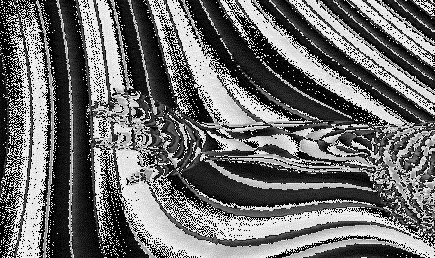

In [ ]:
#位相差出力
phi_file1='Phi_5-1-2.png'
phi_file2='Phi_5-2-2.png'

Phi1=cv2.cvtColor(cv2.imread(phi_file1), cv2.COLOR_BGR2GRAY)
Phi2=cv2.cvtColor(cv2.imread(phi_file2), cv2.COLOR_BGR2GRAY)

z=Phi2-Phi1
Phi_img=Image.fromarray(np.uint8(z)).convert('RGB')
#Phi_img.save('z5.png')
Phi_img

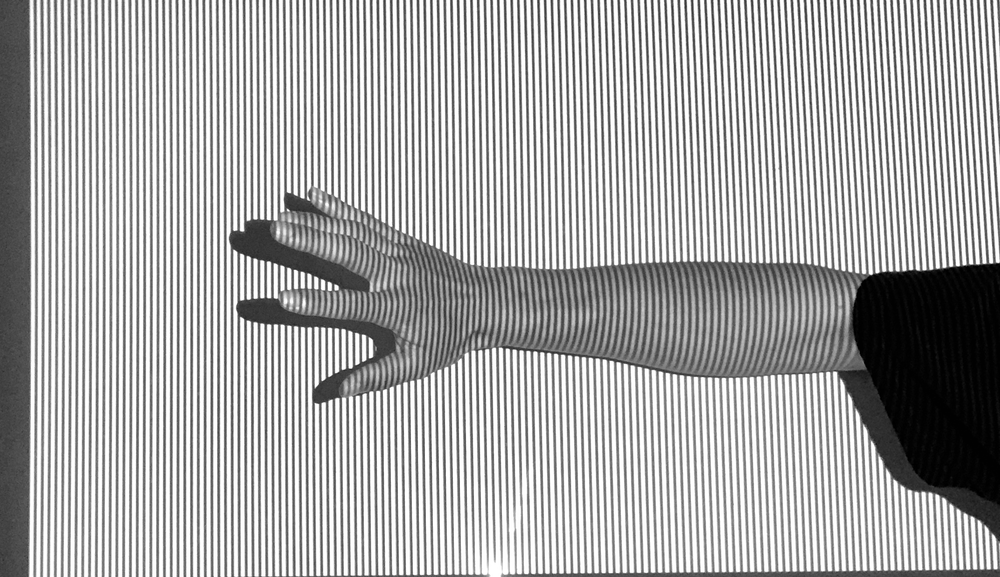

In [ ]:
#trim
file_trim="5-2.JPG"
trim=cv2.cvtColor(cv2.imread(file_trim), cv2.COLOR_BGR2GRAY)
trim=trim[0:-1000,800:-1]
trim_img=Image.fromarray(np.uint8(trim)).convert('RGB')
trim_img

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: divide by zero encountered in true_divide
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: RuntimeWarning: invalid value encountered in true_divide
  


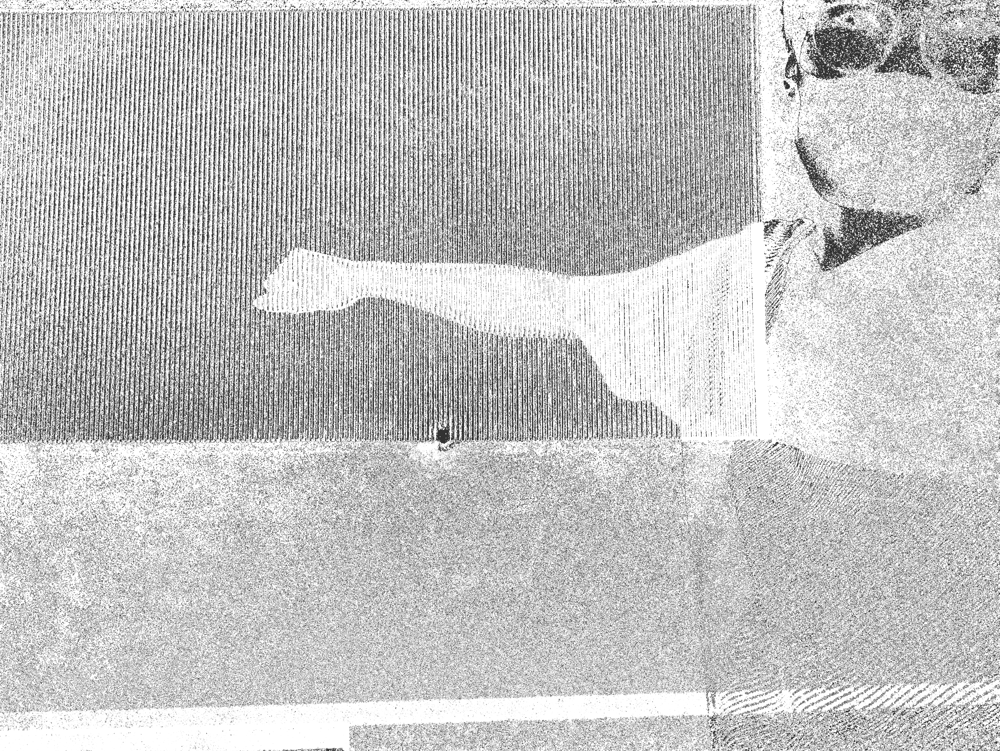

In [ ]:
delta=10
z=(Phi[13]-Phi[12])/(Phi[14]-Phi[12])*delta
Phi_img=Image.fromarray(np.uint8(z)*255/delta*10+50).convert('RGB')
Phi_img.save('z.png')
Phi_img

In [ ]:
#画像の表示
%cd /content/drive/MMyDrive/RUTILEA/実験2
import os
from IPython.display import Image,display_png
for file in sorted(os.listdir()):
    base, ext = os.path.splitext(file)
    if ext == '.png':
        print(file)
        display_png(Image(file))
        print("\n\n\n\n")